In [1]:

from extra_functions import *
import pandas as pd
import numpy as np
from collections import Counter
import os
from os import listdir
from os.path import join,isfile,exists
import warnings
from scipy import stats
warnings.filterwarnings('ignore')
import tensorly as tl
from tensorly.decomposition import tucker
from tensorly.decomposition import non_negative_tucker

def make_directory_if_not_exists(directory_to_make): #
    if not os.path.exists(directory_to_make):
        os.makedirs(directory_to_make)
        print("Directory " , directory_to_make ,  " Created ")
    else:    
        print("Directory " , directory_to_make ,  " already exists")

CPU times: user 1.35 s, sys: 1.07 s, total: 2.42 s
Wall time: 472 ms


In [2]:
data_folder = "../data/SEUSS"
normalized_counts_folder = join(data_folder,"normalized_counts")
make_directory_if_not_exists(normalized_counts_folder)
unique_file_prefix_lst = [f.split(".")[0].replace("_pheno_dict","") for f in listdir(data_folder) if isfile(join(data_folder, f))]
unique_file_prefix_lst = list(set(list(unique_file_prefix_lst)))
unique_file_prefix_lst

Directory  ../data/SEUSS/normalized_counts  already exists


['GSM3308850_up-tf-myc',
 'GSM3308851_up-tf-neuron-hygro-sample1',
 'GSM3308847_up-tf-endo-sample2',
 'GSM3308853_up-tf-neuron-nohygro-sample1',
 'GSM3308852_up-tf-neuron-hygro-sample2',
 'GSM3308854_up-tf-neuron-nohygro-sample2',
 'GSM3308848_up-tf-multi-sample1',
 'GSM3308850_up-tf-klf-myc',
 'GSM3308849_up-tf-multi-sample2',
 'GSM3308844_up-tf-stem-sample2',
 'cell_count_per_perturbation',
 'GSM3308845_up-tf-stem-sample3',
 'GSM3308850_up-tf-klf',
 'GSM3308846_up-tf-endo-sample1']

In [3]:
diff_ssGSEA_base_path = "../results/diff_ssGSEA"

make_directory_if_not_exists(diff_ssGSEA_base_path)


Directory  ../results/diff_ssGSEA  already exists


In [4]:
# build sc-RNA seq gene counts expression matrix by gene counts file and perturbation barcode file
# match perturbation by pertubation dictionary
# rows are genes. columns are perturbations

def build_gene_expression_df (gene_counts_file, barcode_dictionary_file): 
    gene_counts = pd.read_csv(gene_counts_file, sep='\t',index_col=0)
    barcode_dict = pd.read_csv(barcode_dictionary_file, header=None)
    tf = barcode_dict.iloc[0:,0]
    bc = barcode_dict.iloc[0:,1]
    barcode_dict = dict(zip(tf,bc))
    for i in barcode_dict:
        barcode_dict[i] = barcode_dict[i].split(',')
    all_perturbations = []
    all_perturbation_number = []
    for bc in gene_counts.columns:
        perts = []
        for key in barcode_dict.keys():
            if bc in barcode_dict[key]:
                perts.append(key)
        all_perturbation_number.append(len(perts))
        if len(perts) == 0:
            all_perturbations.append("no_pert")
        else:
            all_perturbations.append('-'.join(str(x) for x in perts))
    gene_counts.columns = all_perturbations
    print('gene_counts.shape',gene_counts.shape)
    return gene_counts,barcode_dict,all_perturbations,all_perturbation_number

In [5]:
# selection perturbation 
# k: number of perturbations of each column(gene)
def select_perturbation(k, all_perturbation_number,gene_counts):
    unique_perturbation = np.unique(gene_counts.columns)
    all_perturbation_number = pd.Series(all_perturbation_number, index=gene_counts.columns, name="Perturbations Number")
    k_pert = all_perturbation_number.index[all_perturbation_number == k]
    gene_counts_k_pert = gene_counts.loc[:,np.unique(k_pert)]
    print(all_perturbation_number.value_counts())
    print('gene_counts_k_pert.shape',gene_counts_k_pert.shape)
    return gene_counts_k_pert


In [6]:

def normalize_gene_counts_df (gene_counts_k_pert,output_folder,outputfile_prefix):
    k_col = gene_counts_k_pert.columns
    k_col = list(k_col)
    counts = Counter(k_col) 
    for s,num in counts.items():
        for suffix in range(1, num + 1): 
            k_col[k_col.index(s)] = s + '-'+str(suffix) 
    dict(counts)
    gene_counts_k_pert.columns = k_col
    counts_normalized = gene_counts_k_pert
    for i in range(counts_normalized.shape[1]):
        total_count = sum(counts_normalized.iloc[:,i])
        counts_normalized.iloc[:,i] = (counts_normalized.iloc[:,i]/total_count)*1000+1
    counts_normalized = np.log(counts_normalized)
    counts_normalized.to_csv(join(output_folder,'{}_counts_normalized.tsv'.format(outputfile_prefix)), sep="\t")
    
    return counts_normalized

In [ ]:
for file_prefix in unique_file_prefix_lst:
    print("Now attempting {}".format(file_prefix))
    gene_counts_file = join(data_folder,"{}.counts.tsv".format(file_prefix))
    barcode_dictionary_file = join(data_folder,"{}_pheno_dict.csv".format(file_prefix))
    if exists(gene_counts_file) and exists(barcode_dictionary_file):
        gene_counts, barcode_dict,all_perturbations,all_perturbation_number = build_gene_expression_df (gene_counts_file, barcode_dictionary_file)
        for k in list(set(list(all_perturbation_number))):
            if exists(join(normalized_counts_folder,"{}_{}_counts_normalized.tsv".format(file_prefix,k)))==False:
                gene_counts_uni = select_perturbation(k, all_perturbation_number,gene_counts) #all cells with k perturbations; column names are perturbations and NOT unique
                counts_normalized = normalize_gene_counts_df(gene_counts_uni,normalized_counts_folder,"{}_{}".format(file_prefix,k))
            else:
                print("Already did {}".format(file_prefix))
    else:
        print("{} has incomplete data".format(file_prefix))
    
        
        

## Retain only genes with less than 75% zero values across all cells in a particular sample.

In [7]:
def read_file_line_by_line(file_path):
    lines = []
    with open(file_path) as fp:
        Lines = fp.readlines()
        for line in Lines:
            lines.append(line.strip().replace('"',""))
    return lines

def write_file_line_by_line(lines,file_path):
    with open(file_path,"w") as fp:
        fp.writelines(["{}\n".format(l) for l in lines])
    #return lines
fraction_genes_zero_max = 0.75
genes_to_keep_folder = join(normalized_counts_folder,"genes_to_keep",str(fraction_genes_zero_max))

make_directory_if_not_exists(genes_to_keep_folder)

Directory  ../data/SEUSS/normalized_counts/genes_to_keep/0.75  already exists


In [ ]:


all_normalized_count_files = [f for f in listdir(normalized_counts_folder) if isfile(join(normalized_counts_folder, f))]

for normalized_count_file in all_normalized_count_files:
    file_prefix = normalized_count_file.replace("_counts_normalized.tsv","")
    selected_gene_file_path = join(genes_to_keep_folder,"{}_selected_genes.txt".format(file_prefix))
    print("Attempting {}".format(normalized_count_file))
    if exists(selected_gene_file_path)==False:
        single_cell_expression_df = pd.read_table(join(normalized_counts_folder,normalized_count_file),index_col=0)
        zero_proportion_per_gene_series = (single_cell_expression_df == 0).astype(int).sum(axis=1)/single_cell_expression_df.shape[1]
        zero_proportion_per_gene_series = zero_proportion_per_gene_series.sort_values(ascending=False)
        genes_to_keep = zero_proportion_per_gene_series.loc[zero_proportion_per_gene_series < fraction_genes_zero_max].index
        write_file_line_by_line(genes_to_keep,selected_gene_file_path)
        print("Done with {}".format(normalized_count_file))
    else:
        print("Already did {}".format(normalized_count_file))

## Stem Cell Data Set

In [8]:

def to_tensor_multi_n_perturbations(sample_prefixes,n_perturbations_lst,normalized_count_folder,selected_genes_folder): #(all_sample_file,all_samples):
    X = []
    for sample in sample_prefixes:
        sample_counts_ave_lst = []
        all_columns = set()
        for n_perturbations in n_perturbations_lst:
            print("{} n={}".format(sample,n_perturbations))
            selected_genes_path = join(selected_genes_folder,"{}_{}_selected_genes.txt".format(sample,n_perturbations)) #'{}/selectedgenes.csv'.format(all_sample_file+sample)
            counts_normalized_path = join(normalized_count_folder,"{}_{}_counts_normalized.tsv".format(sample,n_perturbations)) #'{}/counts_normalized.tsv'.format(all_sample_file+sample)
            selected_genes = pd.read_csv(selected_genes_path, sep ='\t')
            selected_genes = list(selected_genes.iloc[:,0])
            counts_normalized = pd.read_csv(counts_normalized_path, sep ='\t',index_col=0)

            # line up selected genes
            counts_after_selection = counts_normalized.loc[selected_genes,:]
            counts_after_selection.sort_index(axis =1, inplace = True, ascending = False)

            # line up perturbation by taking the mean gene expression in each perturbation
            col = []
            for name in counts_after_selection.columns:
                name_arr_dash_split = name.split('-')
                if len(name_arr_dash_split) > 1:
                    name = "-".join(name_arr_dash_split[0:-1])
                else:
                    name =name_arr_dash_split[0]
                name_arr_underscore_split = name.split('_')
                if len(name_arr_underscore_split) > 1:
                    name = "_".join(name_arr_underscore_split[0:-1])
                else:
                    name =name_arr_underscore_split[0]
                col.append(name)
            counts_after_selection.columns = col
            counts_ave = counts_after_selection.groupby(by = counts_after_selection.columns, axis = 1).mean()
            counts_ave= counts_ave*100

            # endo-sample1 doesn't has sox2 perturbation, I manually add sox2 by add all 0's

            if "SOX2" not in counts_ave.columns and n_perturbations > 0:
                counts_ave['SOX2'] = [0]*len(counts_ave.index)           
            #if len(counts_ave.columns) == 60:
            #    counts_ave['SOX2'] = [0]*10000
            for c in counts_ave.columns:
                if c not in all_columns:
                    all_columns.add(c)
                else:
                    counts_ave.rename(columns={c:"{}_{}".format(c,n_perturbations)})
                    all_columns.add(c)
            print(sample)
            print(counts_ave.shape)
            sample_counts_ave_lst.append(counts_ave)
        sample_counts_ave = pd.concat(sample_counts_ave_lst,axis=1).fillna(0)
        print("{} n={} sample_counts_ave {}".format(sample,n_perturbations,sample_counts_ave.shape))
        X.append(sample_counts_ave)
    return X,sample_counts_ave





In [113]:
# filter genes by select co-exist genes in all samples

'''def common_gene(X_in,common_genes,common_columns):
    for i in range(len(X_in)):
        X_in[i] = X_in[i][common_columns].loc[common_genes]
        X_in[i].sort_index(axis = 0, inplace = True, ascending = False)
        X_in[i] = X_in[i].values.tolist()
    return np.array(X_in) #, intersect'''

def common_gene(X_in,common_genes,common_columns):
    lst_out = []
    for i in range(len(X_in)):
        df = X_in[i][common_columns].loc[common_genes]
        df = df.sort_index(axis = 0, inplace = False, ascending = False)
        append_this = df.values.tolist()
        lst_out.append(append_this) 
    return lst_out #, intersect

def read_file_line_by_line(file_path):
    lines = []
    with open(file_path) as fp:
        Lines = fp.readlines()
        for line in Lines:
            lines.append(line.strip().replace('"',""))
    return lines

def write_file_line_by_line(lines,file_path):
    with open(file_path,"w") as fp:
        fp.writelines(["{}\n".format(l) for l in lines])
    #return lines
        

In [107]:
samples_to_include = ['GSM3308846_up-tf-endo-sample1',
 'GSM3308847_up-tf-endo-sample2',
 'GSM3308848_up-tf-multi-sample1',
 'GSM3308849_up-tf-multi-sample2',
 'GSM3308844_up-tf-stem-sample2',
 'GSM3308845_up-tf-stem-sample3']

X,counts_ave = to_tensor_multi_n_perturbations(samples_to_include,[0,1,2],normalized_counts_folder,genes_to_keep_folder) 

GSM3308846_up-tf-endo-sample1 n=0
GSM3308846_up-tf-endo-sample1
(5662, 1)
GSM3308846_up-tf-endo-sample1 n=1
GSM3308846_up-tf-endo-sample1
(5009, 61)
GSM3308846_up-tf-endo-sample1 n=2
GSM3308846_up-tf-endo-sample1
(4967, 187)
GSM3308846_up-tf-endo-sample1 n=2 sample_counts_ave (5770, 249)
GSM3308847_up-tf-endo-sample2 n=0
GSM3308847_up-tf-endo-sample2
(5060, 1)
GSM3308847_up-tf-endo-sample2 n=1
GSM3308847_up-tf-endo-sample2
(4181, 61)
GSM3308847_up-tf-endo-sample2 n=2
GSM3308847_up-tf-endo-sample2
(4585, 570)
GSM3308847_up-tf-endo-sample2 n=2 sample_counts_ave (5264, 632)
GSM3308848_up-tf-multi-sample1 n=0
GSM3308848_up-tf-multi-sample1
(8163, 1)
GSM3308848_up-tf-multi-sample1 n=1
GSM3308848_up-tf-multi-sample1
(7104, 61)
GSM3308848_up-tf-multi-sample1 n=2
GSM3308848_up-tf-multi-sample1
(7051, 65)
GSM3308848_up-tf-multi-sample1 n=2 sample_counts_ave (8383, 127)
GSM3308849_up-tf-multi-sample2 n=0
GSM3308849_up-tf-multi-sample2
(6458, 1)
GSM3308849_up-tf-multi-sample2 n=1
GSM3308849_up-tf

In [108]:
all_genes_in_samples = list(set.intersection(*[set(list(df.index)) for df in X]))
#all_genes_in_samples = read_file_line_by_line("../data/SEUSS_stem_common_genes.txt")
len(all_genes_in_samples)

4547

In [109]:


all_columns_in_samples = ['FLI1',
 'HOXA10-mCherry',
 'HOXA1',
 'PAX7',
 'MYCN',
 'MYCL',
 'ASCL5',
 'GATA4',
 'ATF7',
 'SIX1',
 'MYOG',
 'MYC',
 'ONECUT1',
 'POU1F1',
 'NEUROG3',
 'MITF',
 'NEUROG1',
 'HNF1B',
 'HOXB6',
 'GATA1',
 'FOXA1',
 'TFAP2C',
 'SNAI2',
 'HOXA10',
 'MEF2C',
 'ASCL3',
 'SOX3',
 'SPIC',
 'SRY',
 'MESP1',
 'SPIB',
 'SIX2',
 'NRL',
 'POU5F1',
 'CDX2-LMX1A',
 'CDX2',
 'HOXA11',
 'HNF1A',
 'SOX2',
 'MYOD1',
 'no',
 'KLF4',
 'KLF4-mCherry',
 'ETV2',
 'HAND2',
 'GATA6',
 'GLI1',
 'TBX5',
 'mCherry',
 'FOXA3',
 'HAND2-mCherry',
 'NEUROD1',
 'LHX3',
 'RUNX1',
 'FOXA2',
 'SOX10',
 'ASCL4',
 'OTX2',
 'FOXP1',
 'ERG',
 'ESRRG',
 'GATA2',
 'SPI1',
 'LMX1A',
 'ASCL1',
 'CRX']

all_df_columns = []
for df in X:
    all_df_columns.append(set(list(df.columns)))
all_columns_in_samples = list(set.intersection(*all_df_columns))
len(all_columns_in_samples)

66

In [110]:
import pickle

def save_object_as_pickle(object_to_save,file_path):
    with open(file_path, 'wb') as handle:
        pickle.dump(object_to_save, handle, protocol=pickle.HIGHEST_PROTOCOL)
    print("Saved {}".format(file_path))

In [111]:
save_object_as_pickle(X,"../data/X_multi_number_perturbation_5-18-2022")

Saved ../data/X_multi_number_perturbation_5-18-2022


In [114]:
X_np = common_gene(X,all_genes_in_samples,all_columns_in_samples)

In [119]:
# non-negative tucker decomposite into a self-defined 3D core and three 2D factors
ranks = [6,10,10]
core, factors = non_negative_tucker(tensor = tl.tensor(X_np), 
                                    rank = ranks,
                                    n_iter_max=100, 
                                    init='random', 
                                    tol=0.0001, 
                                    random_state=12345, 
                                    verbose=True, 
                                    #ranks=ranks
                                   )

reconstruction error=0.2080910957560478, variation=3.0088841953740397e-05.
converged in 2 iterations.


In [120]:
# reconstruct one side of core.
# this step is necessary when one side of ordinary tensor is too small and there is no need to decomposite that side

factors2 = [factors[0], np.identity(10), np.identity(10)]
reconstructed_cell_line_core = tl.tucker_to_tensor((core, factors2))
reconstructed_cell_line_core.shape

(6, 10, 10)

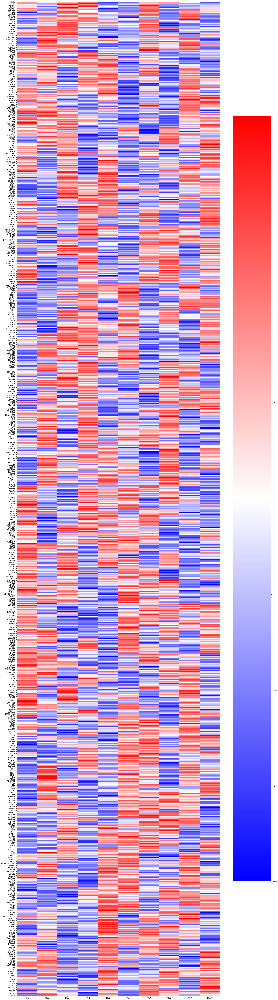

In [123]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as shc

def z_normalize_group(exp_df_in,do_clip = True,do_shift = False,do_rank = False):
    exp_df_in_norm = exp_df_in.copy()
    exp_df_in_norm = exp_df_in_norm[~exp_df_in_norm.index.duplicated(keep='first')]
    if do_rank==True:
        exp_df_in_norm = exp_df_in_norm.rank(axis=0, method='average', numeric_only=None, na_option='keep', ascending=True, pct=False)
    exp_df_in_means = exp_df_in_norm.mean(axis=1)
    exp_df_in_stds = exp_df_in_norm.std(axis=1)
    for i in exp_df_in_norm.index:
        #print(exp_df_in_norm.loc[i,:])
        exp_df_in_norm.loc[i,:] = (exp_df_in_norm.loc[i,:] - exp_df_in_means.loc[i])/exp_df_in_stds.loc[i]
    if do_clip==True:
        exp_df_in_norm.clip(-2, 2, inplace=True) 
    if do_shift==True:
        exp_df_in_norm = exp_df_in_norm + 2
    return exp_df_in_norm
all_columns_in_samples.insert(all_columns_in_samples.index("SOX2")+1,"SOX2_2") 

metaperturbation_df = pd.DataFrame(factors[2],columns = ['MP'+str(i) for i in range(1, factors[2].shape[1]+1)],index=all_columns_in_samples)

dpi = 600
fig = plt.figure(figsize=(20,20))

metagene_df = pd.DataFrame(factors[1],index=all_genes_in_samples,columns=["MG{}".format(i) for i in range(1,factors[1].shape[1]+1)])
dpi = 600
fig = plt.figure(figsize=(25,100)) #
metagene_side_matrix_plot_df = z_normalize_group(metagene_df)
Z = shc.linkage(metagene_side_matrix_plot_df, 'ward')
indexes_cluster_ordered = shc.dendrogram(Z,no_plot = True)["leaves"]

sns.heatmap(metagene_side_matrix_plot_df.iloc[indexes_cluster_ordered],square=False,cmap="bwr",vmin=-2,vmax=2,center=0)
metagene_heatmap_path = "../results/stem_MG_6-1-2022.png"
fig.savefig(metagene_heatmap_path,
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

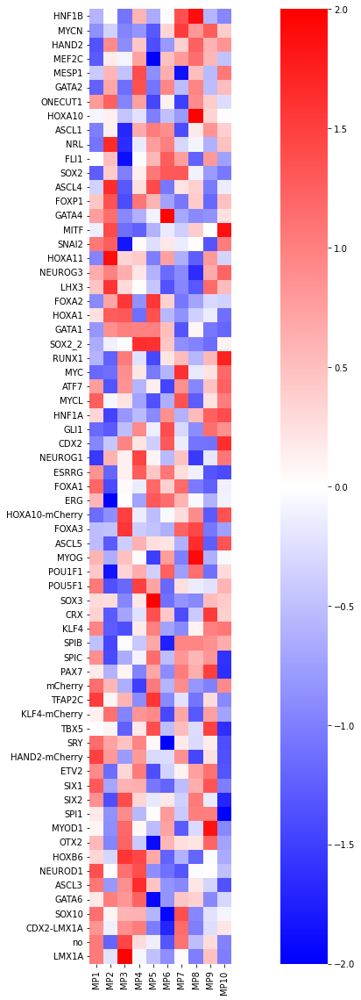

In [121]:




metaperturbation_side_matrix_plot_df = z_normalize_group(metaperturbation_df)

Z = shc.linkage(metaperturbation_side_matrix_plot_df, 'ward')
indexes_cluster_ordered = shc.dendrogram(Z,no_plot = True)["leaves"]

sns.heatmap(metaperturbation_side_matrix_plot_df.iloc[indexes_cluster_ordered],square=True,cmap="bwr",vmin=-2,vmax=2,center=0)
metaperturbation_heatmap_path = "../results/stem_MP_6-1-2022.png"
fig.savefig(metaperturbation_heatmap_path,dpi=dpi,bbox_inches = 'tight')
plt.show()

In [124]:
metagene_df.to_csv("../data/SEUSS_stem_metagenes_6-7-2022.csv")
metaperturbation_df.to_csv("../data/SEUSS_stem_metaperturbations_6-7-2022.csv")

In [126]:
PCA_data_folder = "../data/SEUSS_PCA"


endothelial_PCA_gene_loadings_df = pd.read_csv(join(PCA_data_folder,"endothelial_PCA_gene_loadings.csv"),index_col=0)
multilineage_PCA_gene_loadings_df = pd.read_csv(join(PCA_data_folder,"multilineage_PCA_gene_loadings.csv"),index_col=0)
pluripotent_PCA_gene_loadings_df = pd.read_csv(join(PCA_data_folder,"pluripotent_PCA_gene_loadings.csv"),index_col=0)

def make_IC_meta_component_vs_PCA_vector_df(meta_component_df,PCA_df):
    common_features = [i for i in meta_component_df.index if i in PCA_df.index]
    meta_component_common_features_df = meta_component_df.loc[common_features]
    PCA_common_features_df = PCA_df.loc[common_features]
    IC_df_dict = {meta_component_name:[] for meta_component_name in meta_component_common_features_df.columns}
    for meta_component_name in meta_component_common_features_df.columns:
        meta_component_series = meta_component_common_features_df[meta_component_name]
        for PCA_vector_name in PCA_common_features_df.columns:
            PCA_vector_series = PCA_common_features_df[PCA_vector_name]
            PCA_vs_meta_IC = information_coefficient(meta_component_series, PCA_vector_series)
            IC_df_dict[meta_component_name].append(PCA_vs_meta_IC)
    IC_df = pd.DataFrame(IC_df_dict,index=PCA_common_features_df.columns)
    return IC_df

endothelial_PCA_vs_metagene_IC_df = make_IC_meta_component_vs_PCA_vector_df(endothelial_PCA_gene_loadings_df,metagene_df)
multilineage_PCA_vs_metagene_IC_df = make_IC_meta_component_vs_PCA_vector_df(multilineage_PCA_gene_loadings_df,metagene_df)
pluripotent_PCA_vs_metagene_IC_df = make_IC_meta_component_vs_PCA_vector_df(pluripotent_PCA_gene_loadings_df,metagene_df)



Directory  ../results/meta_vs_PCA  already exists


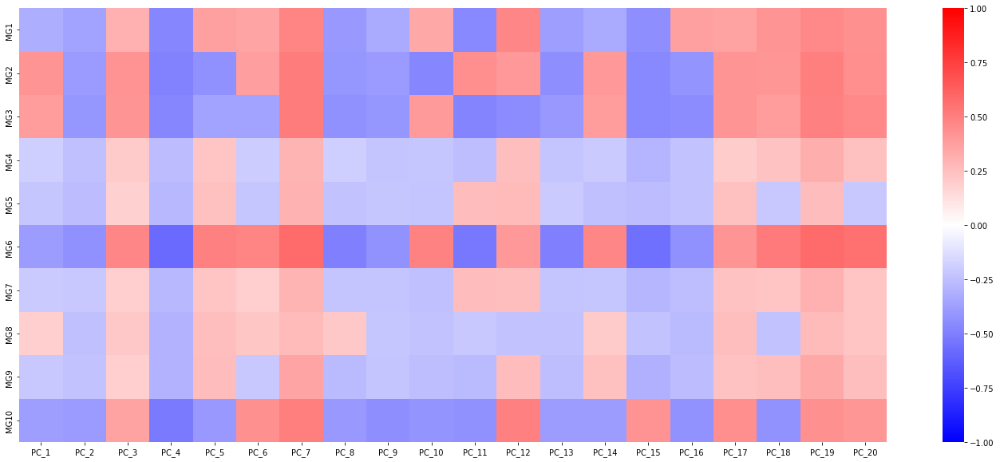

In [127]:
PCA_vs_meta_heatmap_folder = "../results/meta_vs_PCA"
make_directory_if_not_exists(PCA_vs_meta_heatmap_folder)
dpi = 600
fig = plt.figure(figsize=(25,10)) 

sns.heatmap(endothelial_PCA_vs_metagene_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"endothelial_metagenes_vs_loadings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()


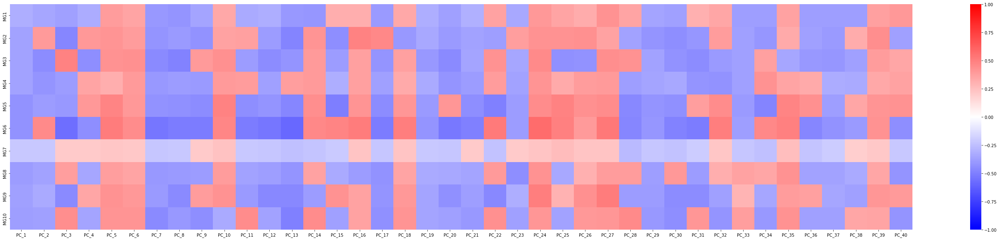

In [128]:
dpi = 600
fig = plt.figure(figsize=(50,10)) 
sns.heatmap(multilineage_PCA_vs_metagene_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)
fig.savefig(join(PCA_vs_meta_heatmap_folder,"multilineage_metagenes_vs_loadings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

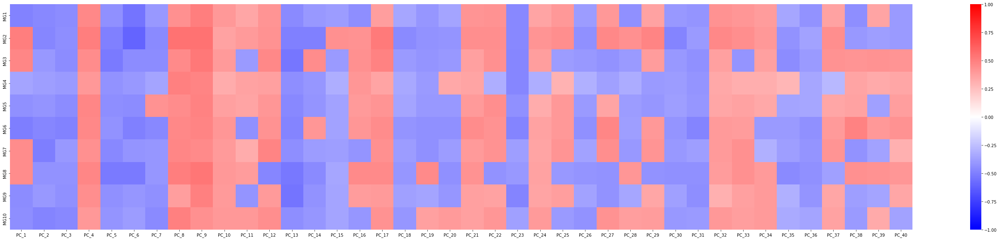

In [129]:
dpi = 600
fig = plt.figure(figsize=(50,10)) 
sns.heatmap(pluripotent_PCA_vs_metagene_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"pluripotent_metagenes_vs_loadings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

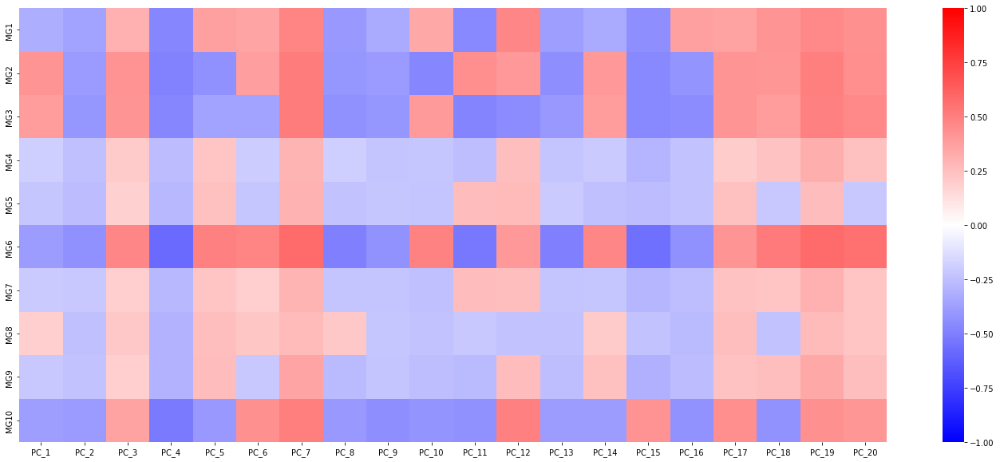

In [130]:
dpi = 600
fig = plt.figure(figsize=(25,10)) 
sns.heatmap(endothelial_PCA_vs_metagene_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"endothelial_metagenes_vs_loadings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

In [131]:
def read_TF_barcode_dict_file(gene_counts_file,barcode_dictionary_file,append_last_number = None,known_multi_perturbations_lst = []):
    gene_counts = pd.read_csv(gene_counts_file, sep='\t',index_col=0)
    barcode_dict = pd.read_csv(barcode_dictionary_file, header=None)
    tf = barcode_dict.iloc[0:,0]
    bc = barcode_dict.iloc[0:,1]
    barcode_dict = dict(zip(tf,bc))
    all_cell_barcodes = []
    for i in barcode_dict:
        cell_barcodes_lst = barcode_dict[i].split(',')
        all_cell_barcodes.extend(cell_barcodes_lst)
        if append_last_number is not None:
            #last_number = barcode_dictionary_file.split("_")[1][-1]
            cell_barcodes_lst = ["{}.{}".format(i,append_last_number) for i in cell_barcodes_lst]
        barcode_dict[i] = cell_barcodes_lst
    for multiperturbation in known_multi_perturbations_lst:
        perturbation_1 = multiperturbation.split('-')[0]
        perturbation_2 = multiperturbation.split('-')[1]
        cells_in_both = [i for i in barcode_dict[perturbation_1] if i in barcode_dict[perturbation_2]]
        for c in cells_in_both:
            barcode_dict[perturbation_1].remove(c)
            barcode_dict[perturbation_2].remove(c)
        barcode_dict[multiperturbation] = cells_in_both
    no_perturbation_cells = [i for i in gene_counts.columns if i not in all_cell_barcodes]
    if append_last_number is not None:
        #last_number = barcode_dictionary_file.split("_")[1][-1]
        no_perturbation_cells = ["{}.{}".format(i,append_last_number) for i in no_perturbation_cells]
    barcode_dict["no"] = no_perturbation_cells
        
    return barcode_dict
known_double_perturbation = [i for i in metaperturbation_df.index if "-" in i]
barcode_dict_folder = "../data/SEUSS"
endothelial_1_barcode_dict_file = join(barcode_dict_folder,"GSM3308846_up-tf-endo-sample1_pheno_dict.csv")
endothelial_2_barcode_dict_file = join(barcode_dict_folder,"GSM3308847_up-tf-endo-sample2_pheno_dict.csv")

endothelial_1_count_file = join(barcode_dict_folder,"GSM3308846_up-tf-endo-sample1.counts.tsv")
endothelial_2_count_file = join(barcode_dict_folder,"GSM3308847_up-tf-endo-sample2.counts.tsv")

multilineage_1_barcode_dict_file = join(barcode_dict_folder,"GSM3308848_up-tf-multi-sample1_pheno_dict.csv")
multilineage_2_barcode_dict_file = join(barcode_dict_folder,"GSM3308849_up-tf-multi-sample2_pheno_dict.csv")

multilineage_1_count_file = join(barcode_dict_folder,"GSM3308848_up-tf-multi-sample1.counts.tsv")
multilineage_2_count_file = join(barcode_dict_folder,"GSM3308849_up-tf-multi-sample2.counts.tsv")

pluripotent_1_barcode_dict_file = join(barcode_dict_folder,"GSM3308844_up-tf-stem-sample2_pheno_dict.csv")
pluripotent_2_barcode_dict_file = join(barcode_dict_folder,"GSM3308845_up-tf-stem-sample3_pheno_dict.csv")

pluripotent_1_count_file = join(barcode_dict_folder,"GSM3308844_up-tf-stem-sample2.counts.tsv")
pluripotent_2_count_file = join(barcode_dict_folder,"GSM3308845_up-tf-stem-sample3.counts.tsv")

endothelial_1_cells_dict = read_TF_barcode_dict_file(endothelial_1_count_file,endothelial_1_barcode_dict_file,append_last_number = 1,known_multi_perturbations_lst=known_double_perturbation)
endothelial_2_cells_dict = read_TF_barcode_dict_file(endothelial_2_count_file,endothelial_2_barcode_dict_file,append_last_number = 2,known_multi_perturbations_lst=known_double_perturbation)

multilineage_1_cells_dict = read_TF_barcode_dict_file(multilineage_1_count_file,multilineage_1_barcode_dict_file,append_last_number = 1,known_multi_perturbations_lst=known_double_perturbation)
multilineage_2_cells_dict = read_TF_barcode_dict_file(multilineage_2_count_file,multilineage_2_barcode_dict_file,append_last_number = 2,known_multi_perturbations_lst=known_double_perturbation)

pluripotent_1_cells_dict = read_TF_barcode_dict_file(pluripotent_1_count_file,pluripotent_1_barcode_dict_file,append_last_number = 1,known_multi_perturbations_lst=known_double_perturbation)
pluripotent_2_cells_dict = read_TF_barcode_dict_file(pluripotent_2_count_file,pluripotent_2_barcode_dict_file,append_last_number = 2,known_multi_perturbations_lst=known_double_perturbation)

In [132]:
endothelial_PCA_embedding_df = pd.read_csv(join(PCA_data_folder,"endothelial_PCA_embedding.csv"),index_col=0)
multilineage_PCA_embedding_df = pd.read_csv(join(PCA_data_folder,"multilineage_PCA_embedding.csv"),index_col=0)
pluripotent_PCA_embedding_df = pd.read_csv(join(PCA_data_folder,"pluripotent_PCA_embedding.csv"),index_col=0)

In [133]:
def combine_perturbation_dictionaries(dict1,dict2):
    dict_out = dict()
    keys_in_common = [k for k in dict1 if k in dict2]
    keys_only_in_1 = [k for k in dict1 if k not in keys_in_common]
    keys_only_in_2 = [k for k in dict2 if k not in keys_in_common]
    for k in keys_in_common:
        dict_out[k] = dict1[k] + dict2[k]
    for k in keys_only_in_1:
        dict_out[k] = dict1[k] 
    for k in keys_only_in_2:
        dict_out[k] = dict2[k] 
    return dict_out

In [134]:
def make_PCA_per_perturbation_avg(PCA_embedding_df,perturbation_cell_dict):
    output_df_dict = {k:[] for k in perturbation_cell_dict}
    for perturbation_key in perturbation_cell_dict:
        cells_w_perturbation = [i for i in perturbation_cell_dict[perturbation_key] if i in PCA_embedding_df.index]
        avg_PC_series = PCA_embedding_df.loc[cells_w_perturbation].mean()
        output_df_dict[perturbation_key] = avg_PC_series
    return pd.DataFrame(output_df_dict).T
endothelial_combined_perturbation_dict = combine_perturbation_dictionaries(endothelial_1_cells_dict,endothelial_2_cells_dict)
endothelial_PCA_per_perturbation_df = make_PCA_per_perturbation_avg(endothelial_PCA_embedding_df,endothelial_combined_perturbation_dict)

multilineage_combined_perturbation_dict = combine_perturbation_dictionaries(multilineage_1_cells_dict,multilineage_2_cells_dict)
multilineage_PCA_per_perturbation_df = make_PCA_per_perturbation_avg(multilineage_PCA_embedding_df,multilineage_combined_perturbation_dict)


pluripotent_combined_perturbation_dict = combine_perturbation_dictionaries(pluripotent_1_cells_dict,pluripotent_2_cells_dict)
pluripotent_PCA_per_perturbation_df = make_PCA_per_perturbation_avg(pluripotent_PCA_embedding_df,pluripotent_combined_perturbation_dict)


In [135]:
endothelial_PCA_vs_metaperturbation_IC_df = make_IC_meta_component_vs_PCA_vector_df(endothelial_PCA_per_perturbation_df,metaperturbation_df)
multilineage_PCA_vs_metaperturbation_IC_df = make_IC_meta_component_vs_PCA_vector_df(multilineage_PCA_per_perturbation_df,metaperturbation_df)
pluripotent_PCA_vs_metaperturbation_IC_df = make_IC_meta_component_vs_PCA_vector_df(pluripotent_PCA_per_perturbation_df,metaperturbation_df)

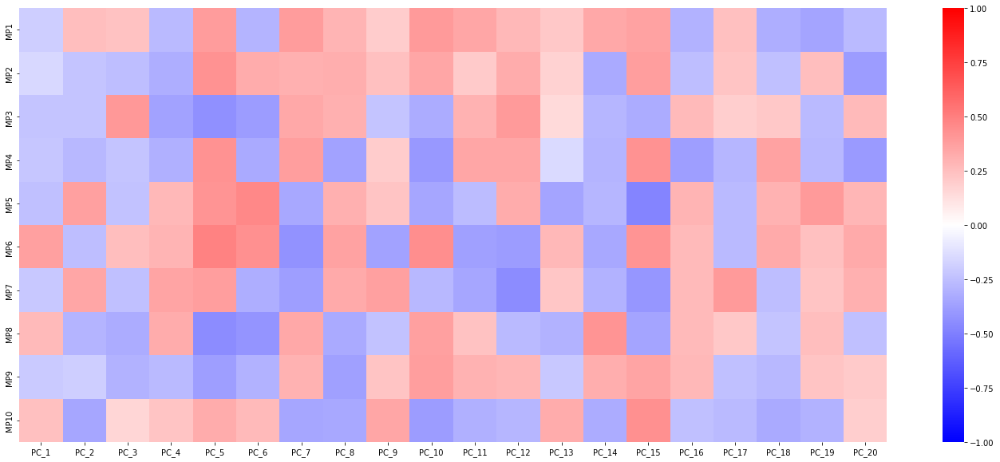

In [136]:
fig = plt.figure(figsize=(25,10)) 
sns.heatmap(endothelial_PCA_vs_metaperturbation_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"endothelial_metaperturbation_vs_embeddings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

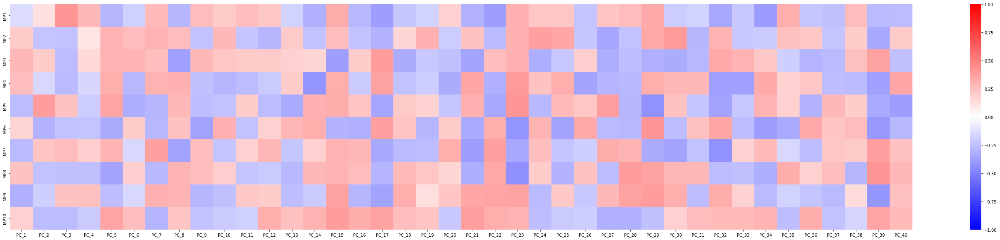

In [137]:
fig = plt.figure(figsize=(50,10)) 
sns.heatmap(multilineage_PCA_vs_metaperturbation_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"multilineage_metaperturbation_vs_embeddings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

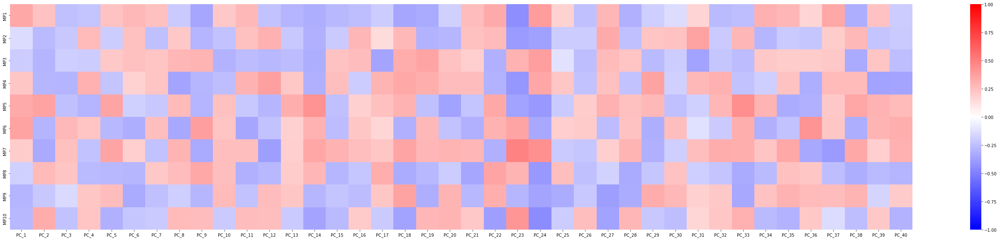

In [138]:
fig = plt.figure(figsize=(50,10)) 
sns.heatmap(pluripotent_PCA_vs_metaperturbation_IC_df,square=True,cmap="bwr",vmin=-1,vmax=1,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"pluripotent_metaperturbation_vs_embeddings.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

## GSEA

GSEA on Meta Genes

In [139]:
# align meta-perturbation where rows are individual genes and
# columns are pert1_sample1 pert1_sample2 ... pertn_samplen

def align_perturbation (core,intersect):
    factors3 = [factors[0], factors[1], np.identity(10)]
    reconstructed_gene = tl.tucker_to_tensor((core, factors3))
    reconstructed_gene_df = []
    for i in range(len(reconstructed_gene[0])):
        gene = []
        for j in range(len(reconstructed_gene[0][0])):
            pert = []
            for k in range(len(reconstructed_gene)):
                pert.append(reconstructed_gene[k][i][j])
            gene = gene + pert
        reconstructed_gene_df.append(gene)
    reconstructed_gene_df = pd.DataFrame(reconstructed_gene_df)
    
    cols = []
    for i in range(1,len(reconstructed_gene[0][0])+1):
        for j in range(1,len(reconstructed_gene)+1):
            tmp = 'P'+ str(i) + '_C' + str(j)
            cols.append(tmp)
    index = sorted(list(intersect), reverse= True)
    reconstructed_gene_df.columns = cols
    reconstructed_gene_df.index = index
    return reconstructed_gene_df

In [140]:
# align meta-perturbation where rows are meta-genes and
# columns are pert1_sample1 pert1_sample2 ... pertn_samplen

def align_perturbation_meta_gene(reconstructed_cell_line_core):
    meta_gene_df = []
    for i in range(len(reconstructed_cell_line_core[0])):
        gene = []
        for j in range(len(reconstructed_cell_line_core[0][0])):
            pert = []
            for k in range(len(reconstructed_cell_line_core)):
                pert.append(reconstructed_cell_line_core[k][i][j])
            gene = gene + pert
        meta_gene_df.append(gene)
    meta_gene_df = pd.DataFrame(meta_gene_df)

    cols = []
    for i in range(1,len(reconstructed_cell_line_core[0][0])+1):
        for j in range(1,len(reconstructed_cell_line_core)+1):
            tmp = 'P'+ str(i) + '_C' + str(j)
            cols.append(tmp)
    meta_gene_df.columns = cols
    index = ['MG'+str(i) for i in range(1, len(reconstructed_cell_line_core[0])+1)]
    meta_gene_df.index = index
    return meta_gene_df

In [142]:
# align perturbation
reconstruct_gene_df = align_perturbation(reconstructed_cell_line_core, all_genes_in_samples)
reconstruct_gene_df.tail()

,P1_C1,P1_C2,P1_C3,P1_C4,P1_C5,P1_C6,P2_C1,P2_C2,P2_C3,P2_C4,...,P9_C3,P9_C4,P9_C5,P9_C6,P10_C1,P10_C2,P10_C3,P10_C4,P10_C5,P10_C6
AASDHPPT,0.486291,0.471695,0.451771,0.467401,0.487626,0.482029,0.366951,0.350162,0.340506,0.343307,...,0.363702,0.384601,0.394834,0.397452,0.382306,0.369135,0.361068,0.364841,0.382542,0.375069
AAMP,1.454182,1.403872,1.367818,1.382276,1.448944,1.424580,1.069060,1.026428,1.006387,1.010492,...,1.120034,1.190828,1.219472,1.232459,1.267519,1.233385,1.207555,1.218913,1.276641,1.249455
AAMDC,0.967045,0.938735,0.899627,0.927140,0.965438,0.956487,0.695560,0.666717,0.649305,0.655280,...,0.770202,0.814534,0.839276,0.842828,0.735614,0.711606,0.691548,0.704785,0.734236,0.724057
AAK1,0.802190,0.774275,0.742247,0.763346,0.797493,0.789903,0.595945,0.574146,0.556105,0.563701,...,0.620246,0.655729,0.670169,0.673400,0.650000,0.627400,0.605600,0.618230,0.646655,0.638589
AAGAB,0.318728,0.307833,0.296086,0.302039,0.314524,0.312452,0.208502,0.202104,0.197052,0.199056,...,0.265342,0.281231,0.289234,0.289640,0.241356,0.233426,0.224423,0.230713,0.238936,0.237683


In [143]:
def make_directory_if_not_exists(directory_to_make): #
    if not os.path.exists(directory_to_make):
        os.makedirs(directory_to_make)
        print("Directory " , directory_to_make ,  " Created ")
    else:    
        print("Directory " , directory_to_make ,  " already exists")
        
def diff_analysis_match_panel(exp_df_in,sample_groups_in,title,file_prefix,n_permutation=1000,n_extreme_per_side=10,n_sampling=10):
    #match_panel_this_df = exp_df_in.copy()
    #sample_groups = sample_groups_in.copy()

    match_panel =  match_features_against_phenotype(pd.Series(sample_groups_in), 
                      exp_df_in,#_noNA,
                      n_job=16,
                      n_permutation=n_permutation,
                      n_extreme=n_extreme_per_side,
                      #target_type = 'binary',
                      #features_type = 'continuous',
                      title= title,
                      file_path_prefix= file_prefix,
                      plot_std=3,
                      n_sampling=n_sampling,
                      layout_side_margin=600,
                      layout_width=2000,
                      random_seed=123)
    return match_panel

In [157]:
gene_set_directory_path = "/home/computer/MSigDB_gene_sets"
GSEA_output_folder = join("../data/SEUSS/","ssGSEA","by_metagene")
make_directory_if_not_exists(GSEA_output_folder)

msigdb_c1_2_5_6_H_fnames = ["c1.all.v6.2.symbols.gmt","c2.all.v6.1.symbols.gmt","c5.all.v6.1.symbols.gmt","c6.all.v6.1.symbols.gmt","h.all.v6.1.symbols.gmt"]

msigdb_c1_2_5_6_H = read_gmts([join(gene_set_directory_path,f) for f in msigdb_c1_2_5_6_H_fnames])

msigdb_c3_IPA_fnames = ["c3.all.v6.1.symbols.gmt","IPA_regulators.gmt"]
msigdb_c3_IPA = read_gmts([join(gene_set_directory_path,f) for f in msigdb_c3_IPA_fnames])

KRAS_gene_sets  = read_gmts([join(gene_set_directory_path,"KRAS_C1_9_gene_sets.gmt")])



gene_set_panels_dict = {"C1_2_5_6_H":msigdb_c1_2_5_6_H,"C3_IPA":msigdb_c3_IPA,"KRAS":KRAS_gene_sets}

for gene_set_panel_name in gene_set_panels_dict:
    gene_set_panel = gene_set_panels_dict[gene_set_panel_name]
    mass_GSEA_df = single_sample_gseas(
    reconstruct_gene_df, gene_set_panel, statistic="ks", n_job=12, file_path=join(GSEA_output_folder,"{}.tsv".format(gene_set_panel_name)))

Directory  ../data/SEUSS/ssGSEA/by_metagene  already exists
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...

Running single-sample GSEA with 935 gene sets ...Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 935 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene sets ...
Running single-sample GSEA with 202 gene

In [144]:
# align perturbation

meta_gene_df = align_perturbation_meta_gene(reconstructed_cell_line_core)
meta_gene_df.head()

,P1_C1,P1_C2,P1_C3,P1_C4,P1_C5,P1_C6,P2_C1,P2_C2,P2_C3,P2_C4,...,P9_C3,P9_C4,P9_C5,P9_C6,P10_C1,P10_C2,P10_C3,P10_C4,P10_C5,P10_C6
MG1,0.515072,0.537741,0.580352,0.437487,0.521403,0.468363,0.264038,0.242757,0.205670,0.237304,...,0.424073,0.499197,0.581512,0.563923,0.372765,0.379535,0.319546,0.320352,0.292077,0.357001
MG2,0.549176,0.498868,0.444776,0.434168,0.457998,0.493709,0.433913,0.486743,0.439126,0.424338,...,0.521373,0.557911,0.499531,0.569395,0.429745,0.448667,0.340534,0.473454,0.472460,0.491318
MG3,0.530592,0.566703,0.562930,0.521108,0.404194,0.509192,0.405310,0.441368,0.385917,0.409678,...,0.294821,0.421358,0.495861,0.453943,0.441696,0.367935,0.408082,0.385426,0.403605,0.382506
MG4,0.428997,0.385263,0.412877,0.486039,0.523626,0.456111,0.275962,0.365441,0.363946,0.294733,...,0.350843,0.328904,0.290505,0.402121,0.588464,0.537253,0.526443,0.561623,0.680550,0.577358
MG5,0.603940,0.575459,0.554891,0.581777,0.635253,0.588059,0.512903,0.452765,0.431567,0.440333,...,0.486498,0.472013,0.432321,0.461439,0.425433,0.351268,0.412741,0.339753,0.417042,0.358975


In [145]:
MP_MG_tensor_lst = []
perturbation_MG_tensor_lst = []
for i in range(1,7):
    layer_df = meta_gene_df[[c for c in meta_gene_df.columns if "_C{}".format(i) in c]]
    layer_df = layer_df.rename(columns = {layer_df.columns[i]:"MP{}".format(i+1) for i in range(0,len(layer_df.columns))})
    MP_MG_tensor_lst.append(layer_df)
    pert_MG_layer_df = pd.DataFrame(layer_df.values.dot(metaperturbation_df.T.values),index=layer_df.index,columns=metaperturbation_df.index)
    perturbation_MG_tensor_lst.append(pert_MG_layer_df)
perturbation_MG_tensor_lst[0]

,MYOD1,SOX10,FLI1,ESRRG,NEUROD1,CRX,SPIB,FOXA2,MITF,ASCL1,...,KLF4-mCherry,LHX3,NRL,SOX2,SOX2_2,POU1F1,HNF1B,HOXB6,ASCL5,TBX5
MG1,2.271037,2.268811,2.197677,2.182914,2.165373,2.230468,2.322602,1.930872,2.118502,2.147300,...,2.220090,2.214868,2.091432,1.789212,5.026374e-18,2.203786,2.276841,2.160291,2.159893,2.271437
MG2,2.769866,2.587637,2.678433,2.672611,2.553021,2.706730,2.604401,2.640078,2.586989,2.677898,...,2.573250,2.660212,2.705033,2.237888,6.645442e-18,2.696354,2.661460,2.595922,2.616201,2.673732
MG3,2.422150,2.456538,2.499916,2.506762,2.407713,2.479948,2.362283,2.341470,2.320677,2.491844,...,2.545911,2.474512,2.517618,2.064404,6.746889e-18,2.437157,2.406720,2.506130,2.399320,2.480753
MG4,2.228715,2.205793,2.051023,2.089509,2.185933,2.360742,2.299998,2.326680,2.153268,2.206863,...,2.193353,2.288384,2.146984,1.697747,6.022736e-18,2.177897,1.967764,2.344489,2.200648,2.144359
MG5,2.357923,2.229194,2.361158,2.252653,2.227030,2.291421,2.140161,2.174620,2.452317,2.315842,...,2.176026,2.363325,2.437698,1.895921,5.268741e-18,2.328027,2.320775,2.089828,2.249391,2.252366
MG6,2.195923,2.447090,2.319912,2.460071,2.305931,2.198173,2.378623,2.317947,2.311417,2.332404,...,2.411427,2.352396,2.489182,2.078960,6.568700e-18,2.419903,2.495394,2.421542,2.431655,2.328720
MG7,2.468732,2.388969,2.467968,2.493441,2.207036,2.556858,2.549594,2.467718,2.426532,2.485522,...,2.317164,2.380289,2.525567,2.125239,6.289228e-18,2.559735,2.486470,2.354087,2.517912,2.456280
MG8,2.885818,2.819522,2.689915,2.816904,2.819544,2.740500,2.766632,2.430614,2.337601,2.567170,...,2.799789,2.700724,2.422581,2.185028,6.427336e-18,2.695923,2.747230,2.828415,2.561916,2.860273
MG9,2.351357,2.317173,2.222702,2.387038,2.325193,2.309131,2.251254,2.493068,2.175106,2.247816,...,2.253386,2.331367,2.308371,1.924166,6.319589e-18,2.362168,2.219481,2.436798,2.292648,2.262054
MG10,2.337241,2.589820,2.581569,2.510010,2.378223,2.469684,2.533450,2.435623,2.459787,2.483326,...,2.744506,2.552807,2.624316,2.166883,6.495383e-18,2.384048,2.556791,2.513301,2.420042,2.650837


In [146]:
def z_normalize_tensor(tensor_lst,clip_n = None):
    normalized_tensor_lst = []
    flattened_tensor_df = pd.concat(tensor_lst,axis=1)
    row_means = flattened_tensor_df.mean(axis=1)
    row_stds = flattened_tensor_df.std(axis=1)
    for layer_df in tensor_lst:
        layer_df_normalized = layer_df.sub(row_means,axis=0).div(row_stds,axis=0)
        if clip_n is not None:
            layer_df_normalized = layer_df_normalized.clip(-clip_n,clip_n)
        normalized_tensor_lst.append(layer_df_normalized)
    return normalized_tensor_lst

In [147]:
perturbation_MG_tensor_z_normed_lst = z_normalize_tensor(perturbation_MG_tensor_lst)

In [148]:
flattened_tensor_df_lst = []
column_suffix_lst = ["endo_1","endo_2","multi_1","multi_2","pluri_1","pluri_2"]
for i in range(0,len(perturbation_MG_tensor_z_normed_lst)):
    column_suffix = column_suffix_lst[i]
    layer_df = perturbation_MG_tensor_z_normed_lst[i]
    layer_df = layer_df[[c for c in layer_df.columns if c!="SOX2_2"]]
    flattened_tensor_df_lst.append(layer_df.rename(columns = {c:"{}_{}".format(c,column_suffix) for c in layer_df.columns}))
flattened_tensor_df = pd.concat(flattened_tensor_df_lst,axis=1)
flattened_tensor_df

,MYOD1_endo_1,SOX10_endo_1,FLI1_endo_1,ESRRG_endo_1,NEUROD1_endo_1,CRX_endo_1,SPIB_endo_1,FOXA2_endo_1,MITF_endo_1,ASCL1_endo_1,...,CDX2-LMX1A_pluri_2,KLF4-mCherry_pluri_2,LHX3_pluri_2,NRL_pluri_2,SOX2_pluri_2,POU1F1_pluri_2,HNF1B_pluri_2,HOXB6_pluri_2,ASCL5_pluri_2,TBX5_pluri_2
MG1,0.622419,0.614828,0.372197,0.321842,0.262010,0.484042,0.798302,-0.537853,0.102136,0.200365,...,0.312819,0.273534,0.299090,0.198653,-0.906419,0.361814,0.639687,-0.034853,0.201498,0.601081
MG2,0.727961,0.170138,0.448074,0.430252,0.064175,0.534696,0.221454,0.330666,0.168154,0.446437,...,0.035502,0.122547,0.296254,0.532182,-0.957934,0.106069,0.248072,-0.185247,0.026659,0.298467
MG3,0.251338,0.363047,0.503961,0.526202,0.204439,0.439096,0.056860,-0.010748,-0.078294,0.477739,...,0.360046,0.659374,0.433292,0.566654,-0.800531,0.276535,0.232290,0.596801,0.137801,0.553332
MG4,0.214345,0.139255,-0.367739,-0.241666,0.074199,0.646837,0.447854,0.535259,-0.032804,0.142761,...,0.571042,0.398390,0.678775,0.375690,-1.040881,0.435458,-0.319343,0.979090,0.419904,0.238007
MG5,0.843330,0.401186,0.854440,0.481760,0.393754,0.614917,0.095387,0.213741,1.167544,0.698795,...,-0.185045,-0.258600,0.249019,0.159126,-1.441625,-0.075613,-0.023894,-0.543342,-0.302069,-0.080662
MG6,-0.262628,0.565408,0.146134,0.608203,0.100040,-0.255210,0.339689,0.139655,0.118129,0.187318,...,0.611203,0.604065,0.267459,0.714543,-0.707599,0.375033,0.556675,0.453218,0.485328,0.264906
MG7,0.639633,0.383173,0.637177,0.719077,-0.201793,0.922981,0.899624,0.636373,0.503947,0.693616,...,-0.145892,-0.277197,-0.097695,0.455161,-0.713378,0.680083,0.539119,-0.256521,0.479124,0.340212
MG8,1.072029,0.880825,0.507033,0.873276,0.880890,0.652923,0.728289,-0.240808,-0.509061,0.153030,...,0.596706,0.429339,0.320209,-0.420008,-1.210153,0.319029,0.190266,0.677404,-0.088234,0.552146
MG9,0.231865,0.122443,-0.179962,0.346082,0.148115,0.096700,-0.088566,0.685487,-0.332318,-0.099571,...,0.013241,-0.228041,0.138296,0.167029,-1.070995,0.371554,-0.170842,0.353109,0.071308,-0.033130
MG10,-0.491393,0.277742,0.252617,0.034712,-0.366596,-0.088088,0.106090,-0.191806,-0.118225,-0.046545,...,0.149279,0.659893,0.263448,0.405955,-1.021813,-0.222889,0.102132,0.182058,-0.209693,0.420618


In [149]:
endothelial_avg_df = (perturbation_MG_tensor_lst[0] + perturbation_MG_tensor_lst[1])/2
multilineage_avg_df = (perturbation_MG_tensor_lst[2] + perturbation_MG_tensor_lst[3])/2
pluripotent_avg_df = (perturbation_MG_tensor_lst[4] + perturbation_MG_tensor_lst[5])/2
avg_tensor_df_lst = [endothelial_avg_df,multilineage_avg_df,pluripotent_avg_df]
avg_perturbation_MG_tensor_z_normed_lst = z_normalize_tensor(avg_tensor_df_lst)
avg_perturbation_MG_tensor_z_normed_lst[0]

,MYOD1,SOX10,FLI1,ESRRG,NEUROD1,CRX,SPIB,FOXA2,MITF,ASCL1,...,KLF4-mCherry,LHX3,NRL,SOX2,SOX2_2,POU1F1,HNF1B,HOXB6,ASCL5,TBX5
MG1,0.462569,0.479635,0.370553,0.266386,0.016927,0.421583,0.701914,-0.671348,0.103049,0.128451,...,0.287330,0.272303,0.007847,-1.029339,-7.157140,0.349289,0.602833,-0.004819,0.187231,0.535535
MG2,0.658018,0.105978,0.439140,0.275244,-0.059684,0.461500,0.178362,0.264075,0.234559,0.431888,...,0.117115,0.389472,0.561475,-0.936790,-7.789432,0.380545,0.366893,0.066343,0.182604,0.399332
MG3,0.244189,0.295504,0.492489,0.562033,0.159230,0.323362,-0.106608,0.032095,-0.130272,0.375800,...,0.526034,0.351526,0.546440,-0.913970,-7.739058,0.295992,0.189873,0.433414,0.103314,0.376513
MG4,0.281902,0.153337,-0.315078,-0.221328,0.091846,0.638105,0.398416,0.813774,-0.014219,0.184266,...,0.188302,0.498722,0.069748,-1.476656,-7.315052,0.016829,-0.652706,0.697723,0.098060,-0.008328
MG5,0.749460,0.194732,0.531877,0.220992,0.305807,0.411192,-0.169811,0.058443,0.722990,0.377511,...,0.026574,0.668478,0.667493,-1.088910,-7.425710,0.426971,0.307196,-0.124779,0.116285,0.248339
MG6,-0.263829,0.533729,0.089281,0.544529,0.093510,-0.177619,0.374400,0.029951,0.115113,0.187278,...,0.385354,0.234062,0.618400,-0.757091,-7.542831,0.477070,0.638430,0.448959,0.518870,0.126596
MG7,0.450118,0.119999,0.364845,0.448112,-0.474435,0.688181,0.727711,0.281838,0.255375,0.414650,...,-0.188638,0.061843,0.483736,-0.719340,-7.403598,0.717798,0.503357,-0.058605,0.563298,0.349848
MG8,0.849882,0.720127,0.293376,0.647360,0.715047,0.494444,0.561011,-0.209876,-0.511720,0.010552,...,0.632567,0.446926,-0.320296,-1.116405,-7.338766,0.365818,0.425498,0.769081,0.027917,0.749617
MG9,0.222768,0.009550,-0.218037,0.195790,0.027387,0.080208,-0.187855,0.527611,-0.400263,-0.186734,...,-0.174898,0.103988,-0.034622,-1.290989,-7.501356,0.132750,-0.326470,0.347110,-0.113035,-0.108147
MG10,-0.276660,0.304542,0.332447,0.177030,-0.172766,-0.029064,0.063132,0.006998,0.046757,0.120107,...,0.708741,0.297387,0.584524,-0.930495,-7.732660,-0.140353,0.309680,0.136695,-0.082915,0.470078


In [158]:
def diff_ssGSEA_by_panel_meta_components(meta_component_df,
                                         ssGSEA_panel_directory,
                                         title_prefix,
                                         output_directory,n_permutation=100,n_extreme_per_side=50,n_sampling=10,
                                        ):
    #metagene_ssGSEA_folder = join("../data/SEUSS/","ssGSEA","by_metagene")
    all_ssGSEA_panel_files = [f for f in listdir(ssGSEA_panel_directory) if isfile(join(ssGSEA_panel_directory, f))]

    #diff_ssGSEA_metagene_folder = join(diff_ssGSEA_base_path,"by_metagene")
    make_directory_if_not_exists(output_directory)
    for component in meta_component_df.index:
        component_series = meta_component_df.loc[component]
        for ssGSEA_panel_file in all_ssGSEA_panel_files:
            ssGSEA_panel_name = ssGSEA_panel_file.replace(".tsv","")
            ssGSEA_panel_df = pd.read_table(join(ssGSEA_panel_directory,ssGSEA_panel_file),index_col=0)
            title_prefix_file_name = title_prefix.replace(" ","_").lower()
            diff_analysis_match_panel(ssGSEA_panel_df,
                                      component_series,
                                      "{} {} vs {}".format(title_prefix, component,ssGSEA_panel_name),
                                      join(output_directory,
                                           "{}_{}_vs_{}".format(title_prefix_file_name,
                                                                component,ssGSEA_panel_name)),
                                      n_permutation=n_permutation,
                                      n_extreme_per_side=n_extreme_per_side,
                                      n_sampling=n_sampling)

In [159]:

metagene_ssGSEA_folder = join("../data/SEUSS/","ssGSEA","by_metagene")
diff_ssGSEA_metagene_folder = join(diff_ssGSEA_base_path,"by_metagene")

diff_ssGSEA_by_panel_meta_components(meta_gene_df,
                                     metagene_ssGSEA_folder,
                                     "Meta Gene",
                                     diff_ssGSEA_metagene_folder,
                                     n_permutation=100,n_extreme_per_side=50,n_sampling=10)

Directory  ../results/diff_ssGSEA/by_metagene  already exists
target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value an

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...


../results/diff_ssGSEA/by_metagene/meta_gene_MG1_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...
../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...





../results/diff_ssGSEA/by_metagene/meta_gene_MG2_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...




../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...






../results/diff_ssGSEA/by_metagene/meta_gene_MG3_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...






../results/diff_ssGSEA/by_metagene/meta_gene_MG4_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...







../results/diff_ssGSEA/by_metagene/meta_gene_MG5_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...





../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...






../results/diff_ssGSEA/by_metagene/meta_gene_MG6_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...




../results/diff_ssGSEA/by_metagene/meta_gene_MG7_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...





../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...







../results/diff_ssGSEA/by_metagene/meta_gene_MG8_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...




Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...







../results/diff_ssGSEA/by_metagene/meta_gene_MG9_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...





../results/diff_ssGSEA/by_

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 9 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...



Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...



../results/diff_ssGSEA/by_metagene/meta_gene_MG10_vs_KRAS.html


target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 16 process ...
Computing MoE with 10 sampling ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...

Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...


Computing p-value and FDR with 100 permutation ...Computing p-value and FDR with 100 permutation ...
Computing p-value and FDR with 100 permutation ...

../results/diff_ssGSEA/by_

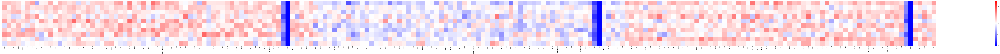

In [160]:
fig = plt.figure(figsize=(250,10)) 



dpi = 250


flattened_tensor_df = pd.concat(avg_perturbation_MG_tensor_z_normed_lst,axis=1)
sns.heatmap(flattened_tensor_df,square=False,cmap="bwr",vmin=-2,vmax=2,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"metagenes_perturbations_avg_all.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

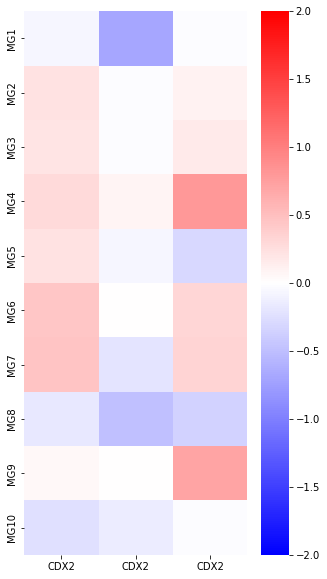

In [161]:
fig = plt.figure(figsize=(5,10)) 



dpi = 250


flattened_tensor_df = pd.concat(avg_perturbation_MG_tensor_z_normed_lst,axis=1)
sns.heatmap(flattened_tensor_df["CDX2"],square=False,cmap="bwr",vmin=-2,vmax=2,center=0)

fig.savefig(join(PCA_vs_meta_heatmap_folder,"metagenes_perturbations_avg_CDX2.png"),
            dpi=dpi,
            bbox_inches = 'tight')
plt.show()

In [162]:
MG2_selected_gene_sets = ["IPA_MMP3_UP","GO_LEUKOCYTE_CELL_CELL_ADHESION","GO_REGULATION_OF_EPITHELIAL_TO_MESENCHYMAL_TRANSITION","GO_REGULATION_OF_DENDRITE_EXTENSION","GO_INTRINSIC_COMPONENT_OF_PEROXISOMAL_MEMBRANE"]
MG2_component_series = meta_gene_df.loc["MG2"]
MG2_combined_ssGSEA_scores_df = pd.concat([pd.read_table("../data/SEUSS/ssGSEA/by_metagene/C1_2_5_6_H.tsv",index_col=0),pd.read_table("../data/SEUSS/ssGSEA/by_metagene/C3_IPA.tsv",index_col=0)],axis=0).loc[MG2_selected_gene_sets]


diff_analysis_match_panel(MG2_combined_ssGSEA_scores_df,
                                      MG2_component_series,
                                      "MG2 Annotation",
                                      join("../results/",
                                           "MG2_annotation"),
                                      n_permutation=1000,
                                      n_extreme_per_side=len(MG2_selected_gene_sets),
                                      n_sampling=50)

target.index (60) & data.columns (60) have 60 in common.
Computing score using information_coefficient with 5 process ...
Computing MoE with 50 sampling ...
Computing p-value and FDR with 1000 permutation ...Computing p-value and FDR with 1000 permutation ...Computing p-value and FDR with 1000 permutation ...Computing p-value and FDR with 1000 permutation ...

Computing p-value and FDR with 1000 permutation ...


../results/MG2_annotation.html


,Score,0.95 MoE,P-Value,FDR
Gene Set,,,,
GO_LEUKOCYTE_CELL_CELL_ADHESION,0.793227,0.012586,0.0002,0.0002
IPA_MMP3_UP,0.761846,0.014767,0.0002,0.0002
GO_INTRINSIC_COMPONENT_OF_PEROXISOMAL_MEMBRANE,0.730835,0.013847,0.0002,0.0002
GO_REGULATION_OF_DENDRITE_EXTENSION,0.725080,0.015783,0.0002,0.0002
GO_REGULATION_OF_EPITHELIAL_TO_MESENCHYMAL_TRANSITION,0.721777,0.014834,0.0002,0.0002


## Neurons

In [163]:
def to_tensor_multi_n_perturbations_neurons(sample_prefixes,n_perturbations_lst,normalized_count_folder,selected_genes_folder): #(all_sample_file,all_samples):
    X = []
    for sample in sample_prefixes:
        sample_counts_ave_lst = []
        all_columns = set()
        for n_perturbations in n_perturbations_lst:
            print("{} n={}".format(sample,n_perturbations))
            selected_genes_path = join(selected_genes_folder,"{}_{}_selected_genes.txt".format(sample,n_perturbations)) #'{}/selectedgenes.csv'.format(all_sample_file+sample)
            counts_normalized_path = join(normalized_count_folder,"{}_{}_counts_normalized.tsv".format(sample,n_perturbations)) #'{}/counts_normalized.tsv'.format(all_sample_file+sample)
            selected_genes = pd.read_csv(selected_genes_path, sep ='\t')
            selected_genes = list(selected_genes.iloc[:,0])
            counts_normalized = pd.read_csv(counts_normalized_path, sep ='\t',index_col=0)
            n_genes_in = counts_normalized.shape[0]
            n_cells_in = counts_normalized.shape[1]
            print("{} {} perturbations: {} cells; {} genes".format(sample,n_perturbations,n_cells_in, n_genes_in))
            # line up selected genes
            counts_after_selection = counts_normalized.loc[selected_genes,:]
            counts_after_selection.sort_index(axis =1, inplace = True, ascending = False)

            # line up perturbation by taking the mean gene expression in each perturbation
            col = []
            for name in counts_after_selection.columns:
                name_arr_dash_split = name.split('-')
                if len(name_arr_dash_split) > 1:
                    name = "-".join(name_arr_dash_split[0:-1])
                else:
                    name =name_arr_dash_split[0]
                name_arr_underscore_split = name.split('_')
                if len(name_arr_underscore_split) > 1:
                    name = "_".join(name_arr_underscore_split[0:-1])
                else:
                    name =name_arr_underscore_split[0]
                col.append(name)
            counts_after_selection.columns = col
            counts_ave = counts_after_selection.groupby(by = counts_after_selection.columns, axis = 1).mean()
            counts_ave= counts_ave*100

            # endo-sample1 doesn't has sox2 perturbation, I manually add sox2 by add all 0's

            '''if "SOX2" not in counts_ave.columns and n_perturbations > 0:
                counts_ave['SOX2'] = [0]*len(counts_ave.index)  '''         
            #if len(counts_ave.columns) == 60:
            #    counts_ave['SOX2'] = [0]*10000
            for c in counts_ave.columns:
                if c not in all_columns:
                    all_columns.add(c)
                else:
                    counts_ave.rename(columns={c:"{}_{}".format(c,n_perturbations)})
                    all_columns.add(c)
            #print(sample)
            #print(counts_ave.shape)
            sample_counts_ave_lst.append(counts_ave)
        sample_counts_ave = pd.concat(sample_counts_ave_lst,axis=1).fillna(0)
        print("{} n={} sample_counts_ave {}".format(sample,n_perturbations,sample_counts_ave.shape))
        X.append(sample_counts_ave)
    return X,sample_counts_ave


In [164]:
samples_to_include_neuron = [
 'GSM3308853_up-tf-neuron-nohygro-sample1', 
 'GSM3308854_up-tf-neuron-nohygro-sample2',
 'GSM3308851_up-tf-neuron-hygro-sample1',
 'GSM3308852_up-tf-neuron-hygro-sample2',]

X_neuron,counts_ave_neuron = to_tensor_multi_n_perturbations_neurons(samples_to_include_neuron,[0,1,2],normalized_counts_folder,genes_to_keep_folder)

all_genes_in_samples_neuron = list(set.intersection(*[set(list(df.index)) for df in X_neuron]))
all_df_columns_neuron = []
for df in X_neuron:
    all_df_columns_neuron.append(set(list(df.columns)))
all_columns_in_samples_neuron = list(set.intersection(*all_df_columns_neuron))
save_object_as_pickle(X_neuron,"../data/X_neurons_5-20-2022")


GSM3308853_up-tf-neuron-nohygro-sample1 n=0
GSM3308853_up-tf-neuron-nohygro-sample1 0 perturbations: 3565 cells; 33694 genes
GSM3308853_up-tf-neuron-nohygro-sample1 n=1
GSM3308853_up-tf-neuron-nohygro-sample1 1 perturbations: 1798 cells; 33694 genes
GSM3308853_up-tf-neuron-nohygro-sample1 n=2
GSM3308853_up-tf-neuron-nohygro-sample1 2 perturbations: 387 cells; 33694 genes
GSM3308853_up-tf-neuron-nohygro-sample1 n=2 sample_counts_ave (2882, 99)
GSM3308854_up-tf-neuron-nohygro-sample2 n=0
GSM3308854_up-tf-neuron-nohygro-sample2 0 perturbations: 3929 cells; 33694 genes
GSM3308854_up-tf-neuron-nohygro-sample2 n=1
GSM3308854_up-tf-neuron-nohygro-sample2 1 perturbations: 1620 cells; 33694 genes
GSM3308854_up-tf-neuron-nohygro-sample2 n=2
GSM3308854_up-tf-neuron-nohygro-sample2 2 perturbations: 317 cells; 33694 genes
GSM3308854_up-tf-neuron-nohygro-sample2 n=2 sample_counts_ave (3322, 101)
GSM3308851_up-tf-neuron-hygro-sample1 n=0
GSM3308851_up-tf-neuron-hygro-sample1 0 perturbations: 1524 cel

In [86]:
'''all_genes_in_samples_neuron = read_file_line_by_line("../data/SEUSS_neuron_common_genes.txt")
len(all_genes_in_samples_neuron)
all_columns_in_samples_neuron = read_file_line_by_line("../data/SEUSS_neuron_common_columns.txt")
len(all_columns_in_samples_neuron)'''

68

In [165]:
X_np_neuron = common_gene(X_neuron,all_genes_in_samples_neuron,all_columns_in_samples_neuron)


In [166]:
# non-negative tucker decomposite into a self-defined 3D core_neuron and three 2D factors_neuron
ranks_neuron = [4,10,10]
core_neuron, factors_neuron = non_negative_tucker(tensor = tl.tensor(X_np_neuron), 
                                    rank = ranks_neuron,
                                    n_iter_max=100, 
                                    init='random', 
                                    tol=0.0001, 
                                    random_state=12345, 
                                    verbose=True, 
                                   )

reconstruction error=0.2092464122134945, variation=7.542945130015188e-05.
converged in 2 iterations.


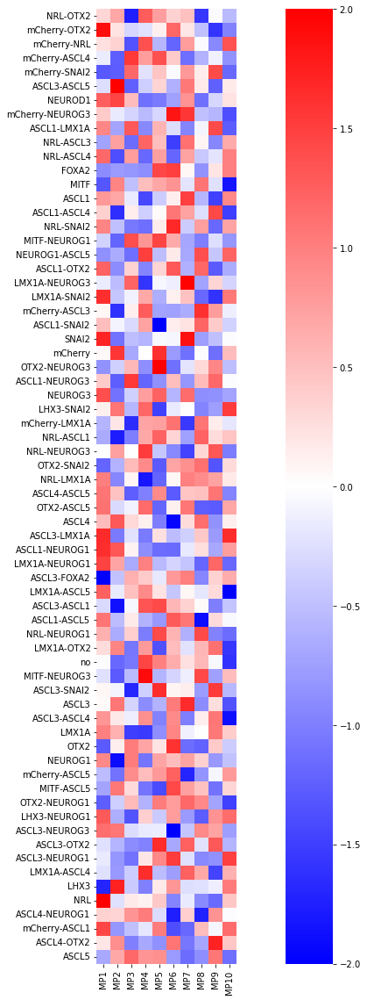

In [167]:
metaperturbation_df_neuron = pd.DataFrame(factors_neuron[2],columns = ['MP'+str(i) for i in range(1, factors_neuron[2].shape[1]+1)],index=all_columns_in_samples_neuron)
plt.figure(figsize=(20,20))
sns.heatmap(z_normalize_group(metaperturbation_df_neuron),square=True,cmap="bwr",vmin=-2,vmax=2,center=0)
plt.show()

In [168]:
factors2_neuron = [factors_neuron[0], np.identity(10), np.identity(10)]
reconstructed_cell_line_core_neuron = tl.tucker_to_tensor((core_neuron, factors2_neuron))
reconstructed_cell_line_core_neuron.shape

(4, 10, 10)

In [169]:
def align_perturbation_neuron (core,intersect):
    factors3 = [factors_neuron[0], factors_neuron[1], np.identity(10)]
    reconstructed_gene = tl.tucker_to_tensor((core, factors3))
    reconstructed_gene_df = []
    for i in range(len(reconstructed_gene[0])):
        gene = []
        for j in range(len(reconstructed_gene[0][0])):
            pert = []
            for k in range(len(reconstructed_gene)):
                pert.append(reconstructed_gene[k][i][j])
            gene = gene + pert
        reconstructed_gene_df.append(gene)
    reconstructed_gene_df = pd.DataFrame(reconstructed_gene_df)
    
    cols = []
    for i in range(1,len(reconstructed_gene[0][0])+1):
        for j in range(1,len(reconstructed_gene)+1):
            tmp = 'P'+ str(i) + '_C' + str(j)
            cols.append(tmp)
    index = sorted(list(intersect), reverse= True)
    reconstructed_gene_df.columns = cols
    reconstructed_gene_df.index = index
    return reconstructed_gene_df

def make_metagene_x_perturbation_tensor(reconstructed_cell_line_core,metaperturbation_df):
    meta_gene_df = align_perturbation_meta_gene(reconstructed_cell_line_core)
    all_cell_line_samples = set([c.split("_")[1] for c in meta_gene_df.columns])
    output_df_lst = []
    #print(len(all_cell_line_samples))
    for cell_line_sample in all_cell_line_samples:
        metagene_MP_df = meta_gene_df[[c for c in meta_gene_df.columns if cell_line_sample in c]]
        metagene_x_perturbation_df = pd.DataFrame(metagene_MP_df.values.dot(metaperturbation_df.T.values),index = metagene_MP_df.index,columns=metaperturbation_df.index)
        output_df_lst.append(metagene_x_perturbation_df)
    return output_df_lst

reconstruct_gene_df_neuron = align_perturbation_neuron(reconstructed_cell_line_core_neuron, all_genes_in_samples_neuron)
metagene_x_perturbation_df_lst_neuron = make_metagene_x_perturbation_tensor(reconstructed_cell_line_core_neuron,metaperturbation_df_neuron)
metagene_x_perturbation_df_lst_neuron[3]

,NRL-OTX2,mCherry-OTX2,mCherry-NRL,mCherry-ASCL4,mCherry-SNAI2,ASCL3-ASCL5,NEUROD1,mCherry-NEUROG3,ASCL1-LMX1A,NRL-ASCL3,...,ASCL3-NEUROG3,ASCL3-OTX2,ASCL3-NEUROG1,LMX1A-ASCL4,LHX3,NRL,ASCL4-NEUROG1,mCherry-ASCL1,ASCL4-OTX2,ASCL5
MG1,3.759281,3.593587,3.601033,3.550109,3.905847,3.646519,3.364996,3.693955,3.697595,3.705723,...,3.772734,3.795032,3.430407,3.602876,3.746830,3.156250,3.525949,3.517616,4.088111,3.726096
MG2,3.409433,3.550001,3.472237,3.274505,3.481814,3.647749,3.859576,3.669595,3.368883,3.483615,...,3.401577,3.317781,3.334959,3.460800,3.586046,3.518254,3.526892,3.190952,3.502817,3.267804
MG3,3.222418,3.079783,3.129508,3.158504,3.296328,3.315051,2.922738,3.166493,2.965952,3.315020,...,3.026499,3.401398,3.174005,3.184295,3.125067,2.997609,3.019918,2.975874,2.742981,3.045953
MG4,3.012067,3.284501,2.963894,3.541228,3.259911,2.920683,3.208481,3.215796,3.346966,3.018494,...,3.078666,3.031682,3.488562,3.097729,3.246142,3.398259,3.118547,3.246546,3.234777,3.115064
MG5,2.363138,2.455460,2.627371,2.173171,2.052985,2.568952,2.485709,2.296640,2.298899,2.481938,...,2.501875,2.146943,2.447774,2.446110,2.502995,2.530736,2.308636,2.517119,2.640489,2.182835
MG6,3.848588,3.430676,3.630744,3.457641,3.596028,3.818387,3.473789,3.490560,3.334162,3.782024,...,3.533168,3.610867,3.281125,3.485109,3.616999,3.259018,3.666516,3.203307,3.553216,3.864520
MG7,3.910100,3.661326,3.921977,3.570890,3.670394,3.741629,3.426718,3.767232,3.368988,3.877623,...,3.446817,3.991163,4.281129,3.833554,3.641071,3.712989,3.533032,3.630817,3.513635,3.200001
MG8,3.758686,3.811078,3.453375,3.852649,3.661853,3.410331,3.256064,3.766332,3.812567,3.527481,...,3.664984,3.906656,3.701918,3.578112,3.320526,3.867948,3.356207,3.776799,3.474818,3.384009
MG9,3.573121,3.848778,3.463013,4.219043,3.427943,3.627816,3.521686,3.554835,3.773237,3.595076,...,3.652972,3.182741,3.943139,3.570881,3.814835,3.906840,3.478888,3.781123,3.629179,3.872446
MG10,3.749515,3.740176,3.578005,3.842598,3.610217,3.727520,3.773302,3.677108,3.668127,3.686349,...,3.622494,3.574756,3.608405,3.561674,3.659722,3.871309,3.730305,3.538457,3.539669,3.798852


Directory  ../results/metagene_x_perturbation  already exists


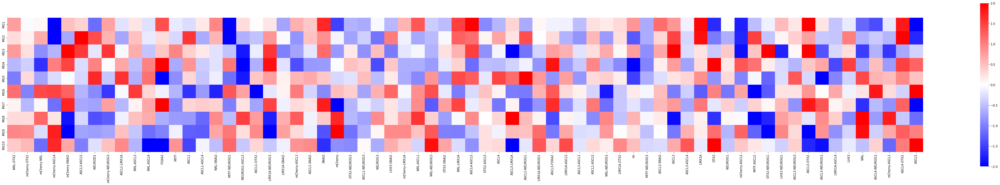

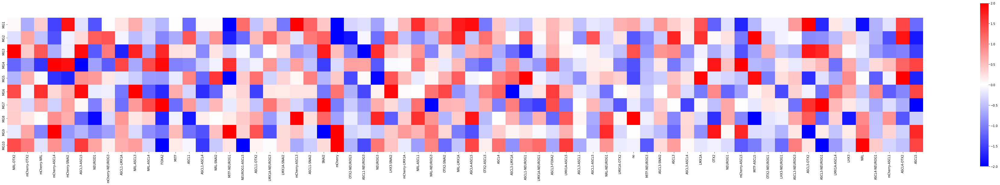

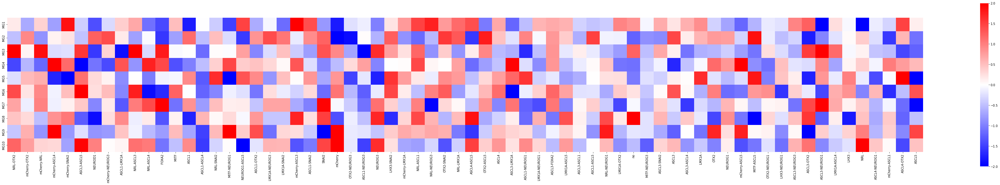

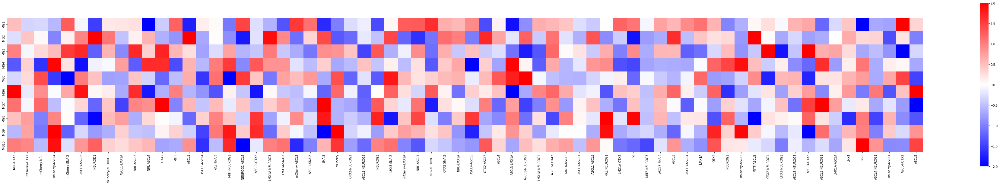

In [170]:
make_directory_if_not_exists("../results/metagene_x_perturbation")
for i in range(0,len(metagene_x_perturbation_df_lst_neuron)):
    output_path = join("../results/metagene_x_perturbation","mg_x_perturbation{}.png".format(i))
    perturbation_mg_df_neuron = metagene_x_perturbation_df_lst_neuron[i]
    plt.figure(figsize=(68,10))

    sns.heatmap(z_normalize_group(perturbation_mg_df_neuron),center = 0,cmap="bwr",vmin=-2,vmax=2,square = True)
    plt.savefig(output_path,dpi=600,bbox_inches = 'tight')
    plt.show()

In [171]:
import itertools
all_single_perturbations_neuron = [c for c in metagene_x_perturbation_df_lst_neuron[0].columns if "-" not in c]
all_2x_perturbations_w_single_neuron = []
for perturbation_pair in itertools.combinations(all_single_perturbations_neuron,2):
    if ("-".join(perturbation_pair) in metagene_x_perturbation_df_lst_neuron[0].columns):
        all_2x_perturbations_w_single_neuron.append("-".join(list(perturbation_pair)))
    if ("-".join(list(perturbation_pair)[::-1]) in metagene_x_perturbation_df_lst_neuron[0].columns):
        all_2x_perturbations_w_single_neuron.append("-".join(list(perturbation_pair)[::-1]))
print(len(all_2x_perturbations_w_single_neuron))

52


In [172]:
perturbation_linear_model_coeffs_df_dict_neuron = {"perturbation_1":[],"perturbation_2":[]}
y_lst_double_perturbations_actual_neuron = []

for multiple_perturbation_str in all_2x_perturbations_w_single_neuron:
    perturbation_1,perturbation_2 = multiple_perturbation_str.split("-")
    for sample_df in metagene_x_perturbation_df_lst_neuron:
        perturbation_linear_model_coeffs_df_dict_neuron["perturbation_1"].append(sample_df[perturbation_1].values.astype("float"))
        perturbation_linear_model_coeffs_df_dict_neuron["perturbation_2"].append(sample_df[perturbation_2].values.astype("float"))
        y_lst_double_perturbations_actual_neuron.append(sample_df[multiple_perturbation_str])
perturbation_linear_model_coeffs_df_neuron = pd.DataFrame(perturbation_linear_model_coeffs_df_dict_neuron)
y_df_double_perturbations_actual_neuron = pd.DataFrame(y_lst_double_perturbations_actual_neuron)
y_df_double_perturbations_actual_neuron


,MG1,MG2,MG3,MG4,MG5,MG6,MG7,MG8,MG9,MG10
ASCL3-FOXA2,3.424776,3.469525,3.292669,3.383721,2.239948,3.544243,3.476389,3.089541,3.030617,3.712015
ASCL3-FOXA2,3.516950,3.630486,3.274135,3.140196,2.768113,3.587692,3.828838,3.519524,3.164424,3.383940
ASCL3-FOXA2,3.689043,3.749076,3.328266,3.136736,2.919503,3.703768,4.054600,3.663190,3.433276,3.454500
ASCL3-FOXA2,3.769705,3.675736,3.246470,3.332634,2.334692,3.691862,3.856392,3.364219,3.656080,3.705989
MITF-NEUROG3,3.344918,3.251108,3.041921,2.804945,2.269949,3.278181,3.123709,3.347634,3.117411,3.585818
...,...,...,...,...,...,...,...,...,...,...
NRL-NEUROG1,3.656855,3.285726,3.175424,3.369708,2.397823,3.201739,3.545627,4.079577,4.103207,3.641730
NEUROG1-ASCL5,3.478962,3.260239,2.895311,2.589083,2.098048,3.433799,3.242451,3.649115,3.233056,3.562250
NEUROG1-ASCL5,3.583194,3.413673,3.193052,2.905088,2.864279,3.453471,3.639895,3.826188,3.265495,3.205888
NEUROG1-ASCL5,3.803119,3.451811,3.315953,3.078324,3.180882,3.482267,3.875535,3.892045,3.534081,3.182611


In [173]:
from scipy.optimize import lsq_linear

combination_perturbation_vectors_df_dict_neuron = {"perturbation":[],"perturbation_1_coeff":[],"perturbation_2_coeff":[],"intercept":[]}
for i in range(0,len(y_lst_double_perturbations_actual_neuron)):
    perturbation_name = y_df_double_perturbations_actual_neuron.iloc[i].name
    X_lst = [perturbation_linear_model_coeffs_df_neuron.iloc[i].T.values[0],perturbation_linear_model_coeffs_df_neuron.iloc[i].T.values[1],np.ones(perturbation_linear_model_coeffs_df_neuron.iloc[i][0].shape[0])]
    X_neuron = np.concatenate(X_lst).reshape(3,10).T
    y = y_df_double_perturbations_actual_neuron.iloc[i].values
    least_squares_result_lst = lsq_linear(X_neuron, y)
    least_squares_solution = least_squares_result_lst["x"]
    combination_perturbation_vectors_df_dict_neuron["perturbation"].append(perturbation_name)
    combination_perturbation_vectors_df_dict_neuron["perturbation_1_coeff"].append(least_squares_solution[0])
    combination_perturbation_vectors_df_dict_neuron["perturbation_2_coeff"].append(least_squares_solution[1])
    combination_perturbation_vectors_df_dict_neuron["intercept"].append(least_squares_solution[2])
    #reg = LinearRegression().fit(X_neuron, np.array(y_lst_double_perturbations_actual_neuron[i].values))
neuron_combination_perturbation_vectors_df = pd.DataFrame(combination_perturbation_vectors_df_dict_neuron)
neuron_combination_perturbation_vectors_df = neuron_combination_perturbation_vectors_df.set_index("perturbation")
neuron_combination_perturbation_vectors_df

,perturbation_1_coeff,perturbation_2_coeff,intercept
perturbation,,,
ASCL3-FOXA2,0.495218,0.405685,0.347686
ASCL3-FOXA2,0.506430,0.419151,0.298850
ASCL3-FOXA2,0.564463,0.348259,0.360161
ASCL3-FOXA2,0.696443,0.273781,0.133015
MITF-NEUROG3,0.388206,0.527225,0.220780
...,...,...,...
NRL-NEUROG1,0.058604,0.938960,0.039147
NEUROG1-ASCL5,1.197823,0.160959,-1.177051
NEUROG1-ASCL5,0.843014,0.019922,0.447991


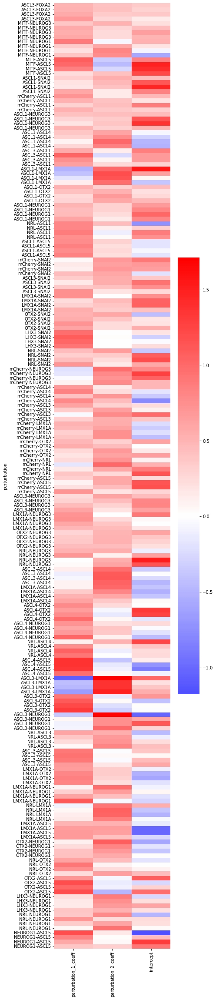

In [174]:
plt.figure(figsize=(6,40))

sns.heatmap(neuron_combination_perturbation_vectors_df,center = 0,cmap="bwr")

plt.show()

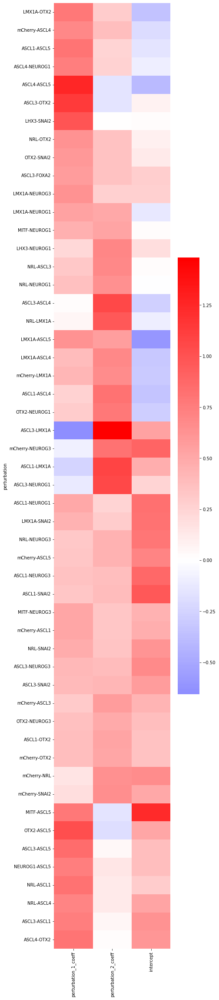

In [175]:
plt.figure(figsize=(6,40))
neuron_combination_perturbation_vectors_averaged_df = neuron_combination_perturbation_vectors_df.reset_index().groupby(['perturbation']).mean()
Z_neuron_coeffs_cluster_linkages = shc.linkage(neuron_combination_perturbation_vectors_averaged_df, 'ward')
perturbation_neurons_indexes_cluster_ordered = shc.dendrogram(Z_neuron_coeffs_cluster_linkages,no_plot = True)["leaves"]
sns.heatmap(neuron_combination_perturbation_vectors_averaged_df.iloc[perturbation_neurons_indexes_cluster_ordered],center = 0,cmap="bwr")

plt.show()

Directory  ../results/double_linear_combos  already exists


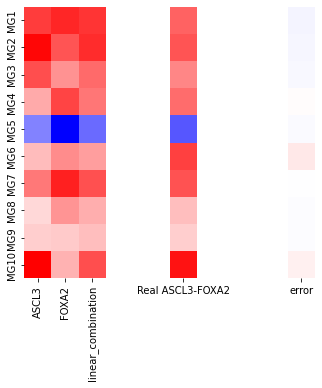

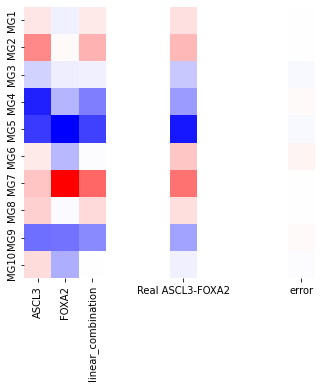

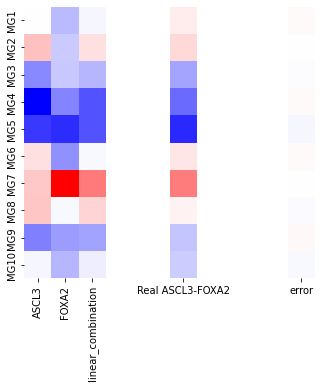

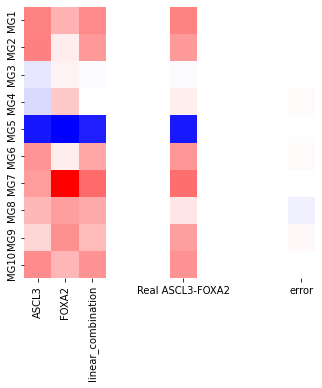

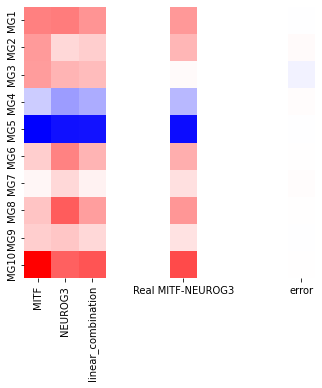

...

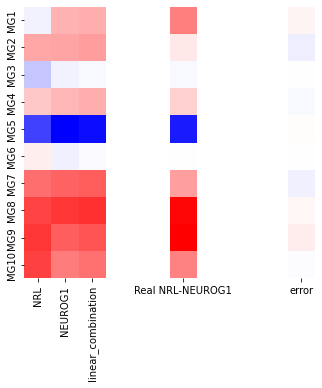

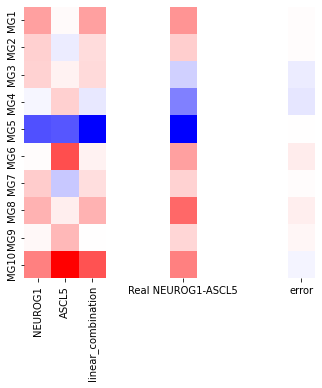

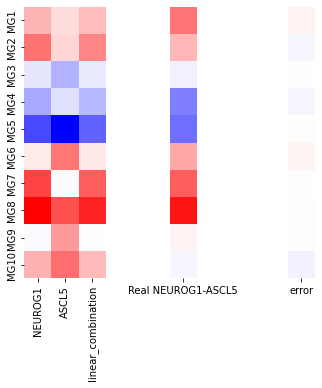

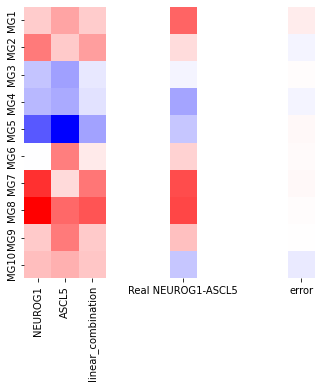

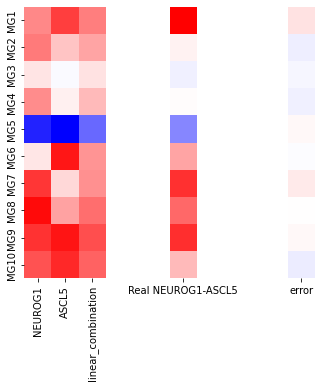

In [178]:
dpi = 600
square = True
make_directory_if_not_exists("../results/double_linear_combos")
for i in range(0,neuron_combination_perturbation_vectors_df.shape[0]):
    single_perturbation_coeffs_row = neuron_combination_perturbation_vectors_df.iloc[i]
    single_perturbation_components_row = perturbation_linear_model_coeffs_df_neuron.iloc[i]
    perturbation_1_numbers = single_perturbation_components_row["perturbation_1"]
    perturbation_2_numbers = single_perturbation_components_row["perturbation_2"]

    double_perturbation_actual = y_df_double_perturbations_actual_neuron.iloc[i]
    #linear_combination = ""

    fig_size = (6,5)
    fig, [ ax_left,ax_right,ax_error] = plt.subplots(1,3,figsize=fig_size)
    
    output_path = join("../results/double_linear_combos","{}_{}.png".format(double_perturbation_actual.name,i))
    
    perturbation_1 = double_perturbation_actual.name.split("-")[0]
    perturbation_2 = double_perturbation_actual.name.split("-")[1]
    perturbation_linear_combination = single_perturbation_coeffs_row["perturbation_1_coeff"]*perturbation_1_numbers + single_perturbation_coeffs_row["perturbation_2_coeff"]*perturbation_2_numbers + single_perturbation_coeffs_row["intercept"]*np.ones(len(perturbation_1_numbers))
    error_series =  double_perturbation_actual - perturbation_linear_combination

    left_heatmap_df_dict = {perturbation_1:perturbation_1_numbers,perturbation_2:perturbation_2_numbers,"linear_combination":perturbation_linear_combination}
    left_heatmap_df = pd.DataFrame(left_heatmap_df_dict,index =double_perturbation_actual.index )
    
    
    all_values_df = pd.concat([left_heatmap_df,double_perturbation_actual],axis=1)
    components_heatmap_max = all_values_df.max().max()
    components_heatmap_min = all_values_df.min().min()
    
    sns.heatmap(left_heatmap_df,cmap="bwr",cbar=False,ax=ax_left,square=square,vmax = components_heatmap_max,vmin = components_heatmap_min)
    sns.heatmap(pd.DataFrame(double_perturbation_actual.rename("Real {}".format(double_perturbation_actual.name))),cmap="bwr",cbar=False,ax=ax_right,square=square,vmax = components_heatmap_max,vmin = components_heatmap_min)
    sns.heatmap(pd.DataFrame(error_series.rename("error"),index =double_perturbation_actual.index),cmap="bwr",cbar=False,ax=ax_error,square=square,center = 0,vmin = -components_heatmap_max,vmax = components_heatmap_max)
    ax_error.yaxis.set_ticks([])
    ax_right.yaxis.set_ticks([])
    fig.savefig(output_path,dpi=dpi,bbox_inches = 'tight')
    plt.show()